In [1]:
import numpy as np
import math
import scipy
import scipy.sparse.linalg
import matplotlib.pyplot as plt
import matplotlib.animation as anm
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # High quality graphics
plt.rcParams['animation.html'] = 'html5'

import sys
import time

In [6]:
# Time step progress bar
def update_progress_bar(current, total):
    sys.stdout.write('\rTime step: [{:<50}] {:.0f}/{:.0f} ({:.2f}%)'.format('=' * int(current/total * 50), current, total, current*100/total))
    sys.stdout.flush()

In [2]:
# All normal velocity components are 0 - since all are "walls", no inlets
ut = 1 # Top wall velocity
ub = 0 # Bottom wall velocity
vl = 0 # Left wall velocity
vr = 0 # Right wall velocity

tf = 1 # Total time of simulation.
ν = 0.05 # Kinematic viscosity of fluid
ρ = 1 # Density of fluid

nx = 32 # Cell centres along x
ny = 32 # Cell centres along y
Lx = 1 # Length of domain along x
Ly = 1 # Length of domain along y
dx = Lx/nx
dy = Ly/ny

print(f'Reynolds number = {ut*Lx/ν}')
print(f'\nMinimum required time step: {min(0.25*(min(dx, dy)**2)/ν, (4*ν)/(ut*ut))}s')
dt = min(0.25*(min(dx, dy)**2)/ν, (4*ν)/(ut*ut))/2
ts = math.ceil(tf/dt)
dt = tf/ts
print(f'Selected time step = {dt}s\nTotal number of time steps = {ts}')
print(f'\nStability Criteria 1 (0.25: dimensionless): {(ν*dt)/(min(dx, dy)**2) < 0.25} ({(ν*dt)/(min(dx, dy)**2)})')
print(f'Stability Criteria 2 (4: dimensionless): {(ut*ut*dt)/ν < 4} ({(ut*ut*dt)/ν})')

Reynolds number = 20.0

Minimum required time step: 0.0048828125s
Selected time step = 0.0024390243902439024s
Total number of time steps = 410

Stability Criteria 1 (0.25: dimensionless): True (0.1248780487804878)
Stability Criteria 2 (4: dimensionless): True (0.048780487804878044)


In [3]:
# Initialise velocities and pressure as zeroes
# (ny+2, nx+2) shape to include ghost cells
# Staggered grid to the minus side

u_0 = np.zeros([ny+2, nx+2])
v_0 = np.zeros([ny+2, nx+2])
p_0 = np.zeros([ny+2, nx+2])
p_rhs = np.zeros([ny+2, nx+2])

# The predictor velocities are separately initialised. Does not have the same BC as correctors
u_p = np.zeros([ny+2, nx+2])
v_p = np.zeros([ny+2, nx+2])

u_sol, v_sol, p_sol = [], [], []
u_sol.append(u_0)
v_sol.append(v_0)
p_sol.append(p_0)

A sparse-solver requires storing the non-NA diagonal coefficients in a sparse diagonal matrix (found in `scipy.sparse`). For example, the "north" pressure coefficient exists for every cell other than the top-most cell. Hence, in a matrix representation from bottom cells to top cells, the final $n_x$ elements of the north coefficient are NA.

It was found in another example that the `spsolve` solver from `scipy.sparse.linalg` module performed relatively the fastest, hence it was implemented here. The inputs required for this are the sparse coefficient matrix and the RHS of the matrix equation $Ax = b$

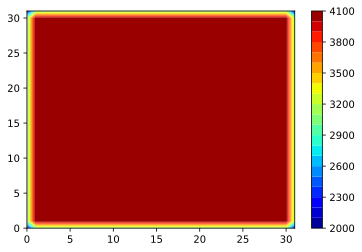

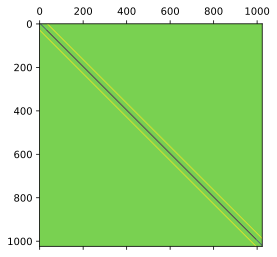

In [4]:
# Pressure-Poisson equation pressure coefficients

# Instead of when using the GS, just take shape of interior nodes (ny, nx) since only sparse matrix is reqd. and
# we won't be looping through interior, in which case the exact index becomes important
Ap = np.zeros([ny, nx])
Ae = np.ones([ny, nx])*(1/(dx*dx))
Aw = np.ones([ny, nx])*(1/(dx*dx))
An = np.ones([ny, nx])*(1/(dy*dy))
As = np.ones([ny, nx])*(1/(dy*dy))

# Set coefficients at boundaries (interior i and js only)
Aw[:, 0] = 0 # Left boundary
Ae[:, -1] = 0 # Right boundary
An[-1, :] = 0 # Top boundary
As[0, :] = 0 # Bottom boundary

Ap = -(Aw + Ae + An + As)

# Just plot a contour to confirm. -Ap should be lowest at corners, then at boundaries, and max at interior cells
plt.figure(figsize = (6, 4))
plt.contourf(-Ap, cmap = plt.cm.jet, levels = 20)
plt.colorbar()
plt.show()

# Creating the sparse matrix
d0 = Ap.reshape(nx*ny)
de = Ae.reshape(nx*ny)[:-1]
dw = Aw.reshape(nx*ny)[1:]
dn = An.reshape(nx*ny)[:-nx]
ds = As.reshape(nx*ny)[nx:]

A1 = scipy.sparse.diags([d0, de, dw, dn, ds], [0, 1, -1, nx, -nx], format = 'csr')
plt.matshow(A1.toarray())
plt.show()

In [7]:
start = time.time()
t = 0
while t < tf:
    u_n = u_sol[-1]
    v_n = v_sol[-1]
    p_n = p_sol[-1]
    
    # Boundary conditions of u
    u_n[:, 1] = 0 # Left wall
    u_n[:, -1] = 0 # Right wall
    u_n[-1, :] = 2*ut - u_n[-2, :] # Top wall ghost cell
    u_n[0, :] = 2*ub - u_n[1, :] # Bottom wall ghost cell 
    
    # Boundary conditions of v
    v_n[-1, :] = 0 # Top wall
    v_n[1, :] = 0 # Bottom wall
    v_n[:, 0] = 2*vl - v_n[:, 1] # Left wall ghost cell
    v_n[:, -1] = 2*vr - v_n[:, -2] # Right wall ghost cell
    
    u_n1 = u_n.copy()
    v_n1 = v_n.copy()
    
    # Predictor step
    # x-momentum for u-predictor; loop over u-CV; Interior points only ([2, nx], [1, ny])
    for i in range(2, nx+1):
        for j in range(1, ny+1):
            u_ea = 0.5*(u_n[j, i+1] + u_n[j, i])
            u_we = 0.5*(u_n[j, i] + u_n[j, i-1])
            u_no = 0.5*(u_n[j, i] + u_n[j+1, i])
            u_so = 0.5*(u_n[j, i] + u_n[j-1, i])
            v_no = 0.5*(v_n[j+1, i] + v_n[j+1, i-1])
            v_so = 0.5*(v_n[j, i] + v_n[j, i-1])
            conv = -(u_ea*u_ea - u_we*u_we)/dx - (u_no*v_no - u_so*v_so)/dy
            diff = ν*((u_n[j, i+1] - 2*u_n[j, i] + u_n[j, i-1])/(dx*dx) + (u_n[j+1, i] - 2*u_n[j, i] + u_n[j-1, i])/(dy*dy))
            u_p[j, i] = (conv + diff)*dt + u_n[j, i]
    
    # y-momentum for v-predictor; loop over v-CV; Interior points only ([1, nx], [2, ny])
    for i in range(1, nx+1):
        for j in range(2, ny+1):
            v_ea = 0.5*(v_n[j, i] + v_n[j, i+1])
            v_we = 0.5*(v_n[j, i] + v_n[j, i-1])
            v_no = 0.5*(v_n[j, i] + v_n[j+1, i])
            v_so = 0.5*(v_n[j, i] + v_n[j-1, i])
            u_we = 0.5*(u_n[j, i] + u_n[j-1, i])
            u_ea = 0.5*(u_n[j, i+1] + u_n[j-1, i+1])
            conv = -(u_ea*v_ea - u_we*v_we)/dx - (v_no*v_no - v_so*v_so)/dy
            diff = ν*((v_n[j, i+1] - 2*v_n[j, i] + v_n[j, i-1])/(dx*dx) + (v_n[j+1, i] - 2*v_n[j, i] + v_n[j-1, i])/(dy*dy))
            v_p[j, i] = (conv + diff)*dt + v_n[j, i]
    
    # Solve the PPE
    # RHS: Looped over the scaler-CV; Interior points only ([1, nx], [1,ny])
    for i in range(1, nx+1):
        for j in range(1, ny+1):
            p_rhs[j, i] = (u_p[j, i+1] - u_p[j, i])/dx + (v_p[j+1, i] - v_p[j, i])/dy
    p_rhs = p_rhs*(ρ/dt)
    
    p_1d = scipy.sparse.linalg.spsolve(A1, p_rhs[1:-1, 1:-1].ravel())
#     p_1d, inf = scipy.sparse.linalg.bicg(A1, p_rhs[1:-1, 1:-1].ravel(), tol = 1e-10)
#     p_1d, inf = scipy.sparse.linalg.cg(A1, p_rhs[1:-1, 1:-1].ravel())
    
    p_n1 = np.zeros([ny+2, nx+2])
    p_n1[1:-1, 1:-1] = p_1d.reshape([ny, nx])
    
    # Corrector step
    # Only interior points of velocity. Accordingly slice p[j, i+1] etc.
    u_n1[1:-1, 2:-1] = u_p[1:-1, 2:-1] - (dt/(ρ*dx))*(p_n1[1:-1, 2:-1] - p_n1[1:-1, 1:-2])
    v_n1[2:-1, 1:-1] = v_p[2:-1, 1:-1] - (dt/(ρ*dx))*(p_n1[2:-1, 1:-1] - p_n1[1:-2, 1:-1])
    
    # Store to solution list
    u_sol.append(u_n1)
    v_sol.append(v_n1)
    p_sol.append(p_n1)
    
    time.sleep(dt)
    t+=dt
    progress = t / tf  # Calculate progress as a percentage
    update_progress_bar(int(t/dt), ts)

update_progress_bar(ts, ts)
end = time.time() - start
print(f'\nTime taken for simulation: {round(end, 3)}s')

Time step: [==================================================] 410/410 (100.00%)
Time taken for simulation: 13.19s


In [8]:
(141.853 - end)*100/141.853

90.70135674597604

Compared to the Gauss-Seidel Over-relaxation solver, this `spsolve` solver performed much better, completing the entire simulation in 10% time

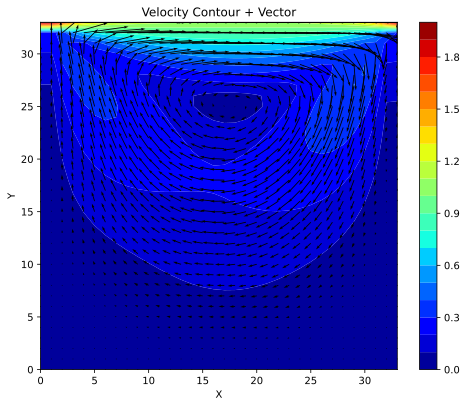

In [9]:
width = 8
frame = -1
fig, ax = plt.subplots(figsize = (width, (Ly/Lx)*width*0.8))
cont = ax.contourf(np.sqrt(u_sol[-1]**2 + v_sol[-1]**2), cmap = plt.cm.jet, levels = 20)
ax.quiver(u_sol[frame], v_sol[frame], scale=5)
plt.colorbar(cont, ax=ax)
ax.set(xlabel = 'X', ylabel = 'Y', title = 'Velocity Contour + Vector')
# ax.set(xlim = [1, nx-1], ylim = [1, ny-1]
plt.show()

# plt.figure(figsize = (6, 6))
# plt.contourf(np.sqrt(u_p**2 + v_p**2), cmap = plt.cm.jet, levels = 20)
# plt.quiver(u_sol[-1], v_sol[-1], scale=5)
# plt.xlim([1, nx-1])
# plt.ylim([1, ny-1])

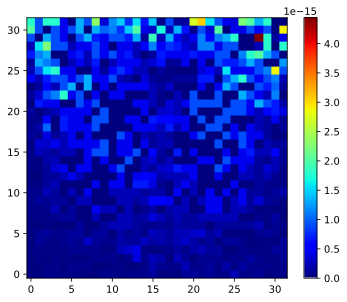

In [10]:
u_f = u_sol[-1]
v_f = v_sol[-1]
div_u = (u_f[1:-1, 2:] - u_f[1:-1, 1:-1])/dx + (v_f[2:, 1:-1] - v_f[1:-1, 1:-1])/dy
width = 6
fig, ax = plt.subplots(figsize = (width, (Ly/Lx)*width*0.8))
cont = ax.imshow(abs(div_u), cmap = plt.cm.jet, origin = 'lower', vmin = 0)
plt.colorbar(cont, ax=ax)
plt.show()

Compared to the Gauss-Seidel OR solver, the divergence error in the `spsolve` method is much smaller (~1E-6 vs ~1E-15)

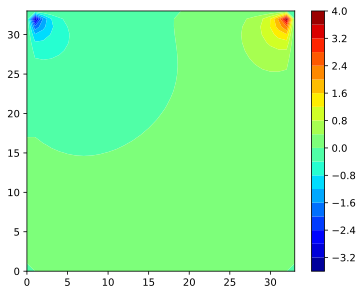

In [11]:
# Pressure contour
width = 6
plt.figure(figsize = (width, (Ly/Lx)*width*0.8))
plt.contourf(p_sol[-1], cmap = plt.cm.jet, levels = 20)
plt.colorbar()
plt.show()

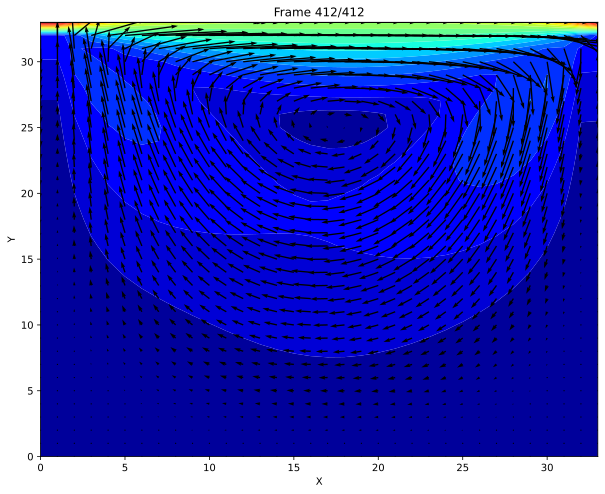

In [12]:
# Vector animation
width = 10
fig, ax = plt.subplots(figsize = (width, (Ly/Lx)*width*0.8))
def update(frame):
    ax.clear()  # Clear the previous plot
    ax.contourf(np.sqrt(u_sol[frame]**2 + v_sol[frame]**2), cmap = plt.cm.jet, levels = 20)
    ax.quiver(u_sol[frame], v_sol[frame], scale=5)
    ax.set(xlabel = 'X', ylabel = 'Y', title = f'Frame {frame + 1}/{len(u_sol)}')

animation = anm.FuncAnimation(fig, update, frames=list(range(0, len(u_sol), int(len(u_sol)/100)))+[len(u_sol)-1], repeat=False)
animation

In [98]:
pip install Pillow

Note: you may need to restart the kernel to use updated packages.


In [99]:
animation.save('vector_animation_sparse_FVM.gif', writer = 'pillow', fps = 10)

Sparse solver solution:

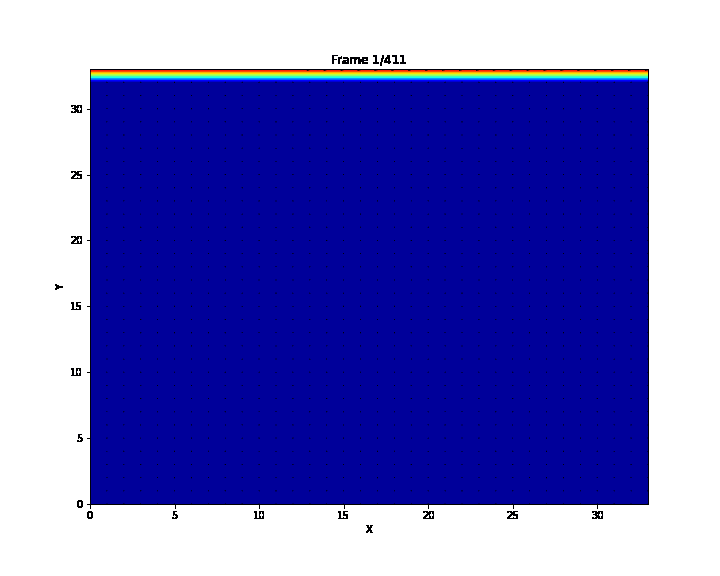

Gauss-Seidel OR

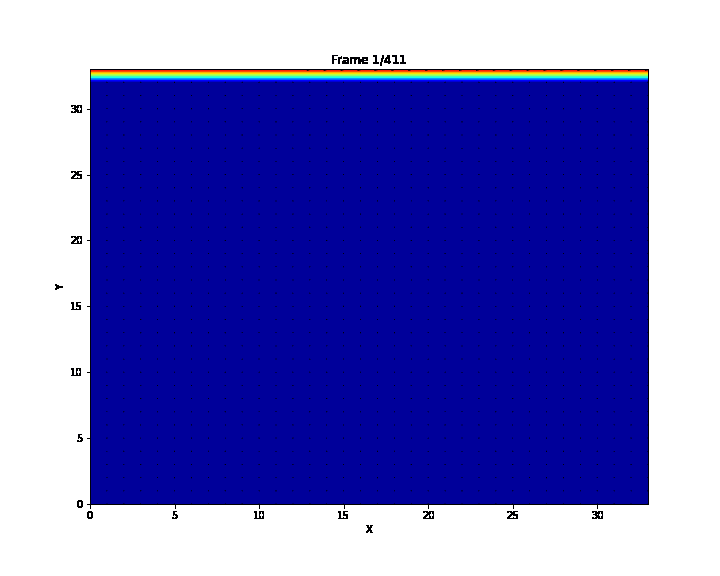